# Assignment 2 — Digital Image Processing

**Folder layout I’m using**
```bash
src/
  main.ipynb  #code, results, and written answers
audio_files/
    1.wav
images/
    2_1.png
    2_2.png
    3.jpg
README.md
```

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from scipy.io import wavfile
import time

#to save all figures for better visualization
OUTPUT_DIR = "../images/outputs"
os.makedirs(OUTPUT_DIR, exist_ok=True)

## Q1. Laplacian Sharpening

We want to show that **Laplacian sharpening** is just a special case of **Unsharp Masking**.


### Formulas:

- **Unsharp Masking:**

$$
g(x,y) = f(x,y) + k \cdot \big(f(x,y) - f_{\text{blurred}}(x,y)\big)
$$

Here we're basically adding the "detail" (difference between original and blurred) back to the original.

- **Laplacian Sharpening:**

$$
g(x,y) = f(x,y) - c \cdot \nabla^2 f(x,y)
$$

Here we're directly using the Laplacian (second derivative) to highlight edges and sharpen.

where:  
- $f(x,y)$ = original image  
- $g(x,y)$ = sharpened image  
- $k, c$ = constants  
- $f_{blurred}(x,y)$ = blurred version of the image  
- $\nabla^2 f(x,y)$ = Laplacian of the image  


A blurred image can be approximated using the Laplacian operator:

$$
f_{\text{blurred}}(x,y) \approx f(x,y) + \alpha \cdot \nabla^2 f(x,y)
$$

where $\alpha$ is a constant depending on the blur kernel.

So blurring ≈ original + "Laplacian part."

Difference between original & blurred:

$$
f(x,y) - f_{\text{blurred}}(x,y) \approx -\alpha \cdot \nabla^2 f(x,y)
$$

So basically, the detail we recover in unsharp masking is proportional to the negative Laplacian.

Substituting back into unsharp masking:

$$
g(x,y) = f(x,y) + k \cdot \big(f(x,y) - f_{\text{blurred}}(x,y)\big)
$$

$$
g(x,y) \approx f(x,y) + k \cdot \big(-\alpha \nabla^2 f(x,y)\big)
$$

$$
g(x,y) \approx f(x,y) - (k\alpha) \cdot \nabla^2 f(x,y)
$$


This is exactly the Laplacian sharpening formula:

$$
g(x,y) = f(x,y) - c \cdot \nabla^2 f(x,y)
$$

with:

$$
c = k \cdot \alpha
$$


### Conclusion:
**Laplacian sharpening is a special case of unsharp masking**. The only difference is that in Laplacian sharpening, the blurred image is approximated using the Laplacian operator.

## Q2. Image Denoising

### Implementation
I implemented three denoising filters:

- `mean_filter(img, k)`,
- `gaussian_filter(img, k, sigma)` and
- `median_filter(img, k)` 

In [2]:
import glob

OUTPUT_DIR = "../images/outputs/q2"

#read image in grayscale (float32 array, values 0-255)
def imread_gray(path):
    return np.array(Image.open(path).convert('L'), dtype=np.float32)

#to display multiple images in a singel row
def show_imgs_row(imgs, titles=None, figsize=(15,5), save_path=None):
    n = len(imgs)
    fig = plt.figure(figsize=figsize)
    for i,im in enumerate(imgs):
        ax = plt.subplot(1,n,i+1)
        if im.ndim==2:
            ax.imshow(im, cmap='gray', vmin=0, vmax=255)
        else:
            ax.imshow(np.clip(im/255.0, 0, 1))
        ax.axis('off')
        if titles: ax.set_title(titles[i])
    plt.tight_layout()
    if save_path:
        fig.savefig(save_path, dpi=160, bbox_inches='tight')
    plt.show()

#convolution helpers
def pad_reflect(img, k):
    #pad image with reflection to handleborder effects
    pad = k//2
    if img.ndim==2: #grayscale
        return np.pad(img, ((pad,pad),(pad,pad)), mode='reflect')
    else: # color i.e., 3 channels
        return np.pad(img, ((pad,pad),(pad,pad),(0,0)), mode='reflect')

def conv2d_gray(img, kernel):
    #2D convolution for grayscale images
    k = kernel.shape[0]
    H, W = img.shape
    img_p = pad_reflect(img, k)
    out = np.zeros((H, W), dtype=np.float32)
    for i in range(H):
        for j in range(W):
            out[i,j] = np.sum(img_p[i:i+k, j:j+k] * kernel)
    return out

#filters
def mean_filter(img, k=3):
    #mean or average filter with kernel size k
    kernel = np.ones((k,k), dtype=np.float32) / (k*k)
    return conv2d_gray(img, kernel)

def gaussian_kernel(k=5, sigma=1.0):
    #generating normalized gaussian kernel
    ax = np.arange(-(k//2), k//2+1)
    xx, yy = np.meshgrid(ax, ax)
    g = np.exp(-(xx**2 + yy**2) / (2*sigma**2))
    g /= np.sum(g)
    return g.astype(np.float32)

def gaussian_filter(img, k=5, sigma=1.0):
    #gaussian smoothing filter
    gk = gaussian_kernel(k, sigma)
    return conv2d_gray(img, gk)

def median_filter(img, k=3):
    H, W = img.shape
    img_p = pad_reflect(img, k)
    out = np.zeros((H, W), dtype=np.float32)
    for i in range(H):
        for j in range(W):
            window = img_p[i:i+k, j:j+k].ravel()
            out[i, j] = np.median(window)
    return out

Experimenting with different kernel sizes

Processing: ../images/2_1.png


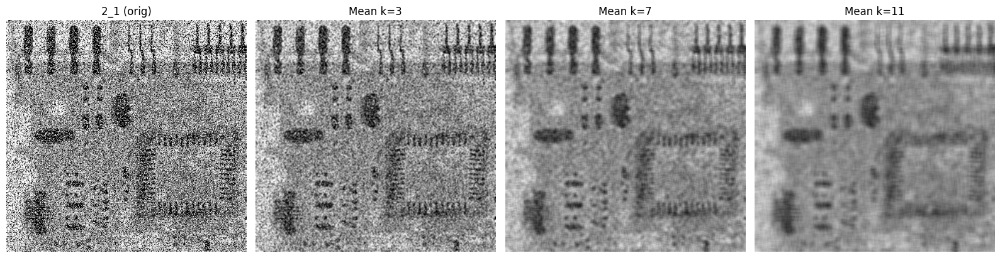

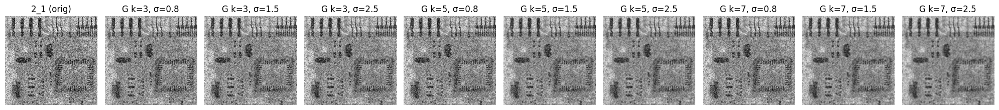

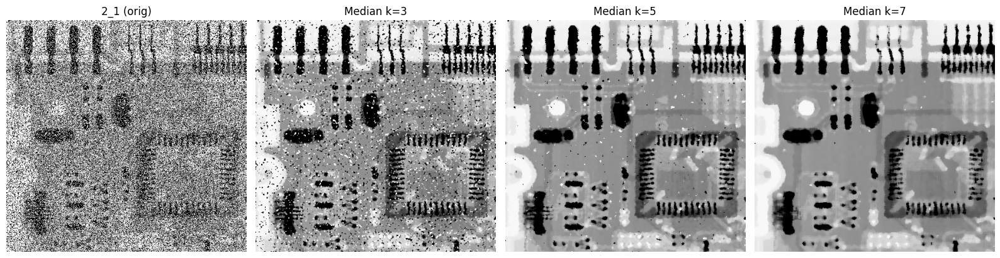

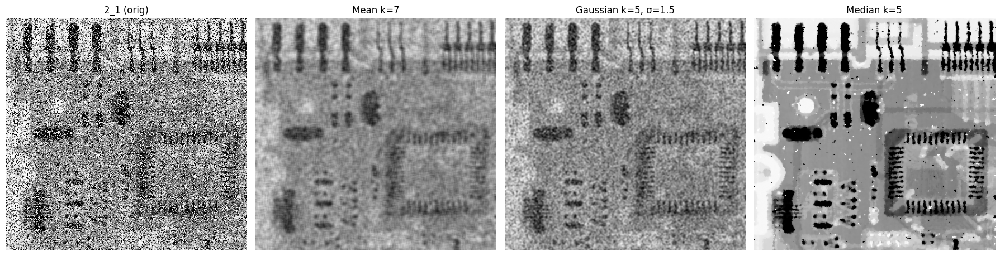

Processing: ../images/2_2.png


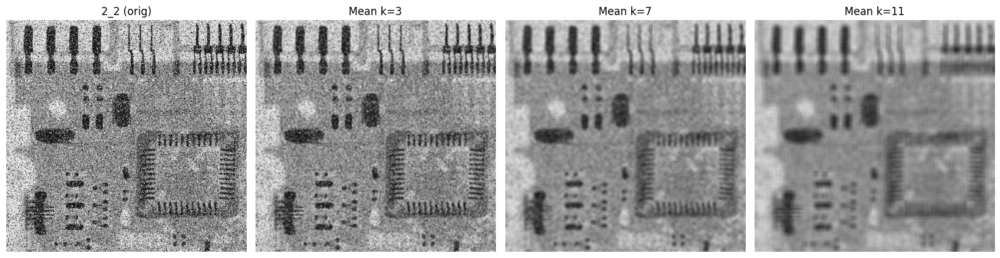

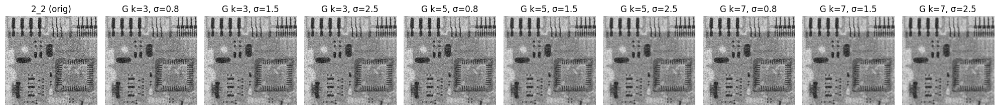

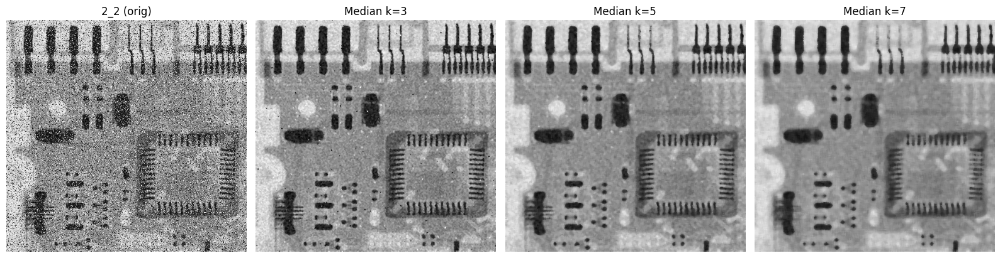

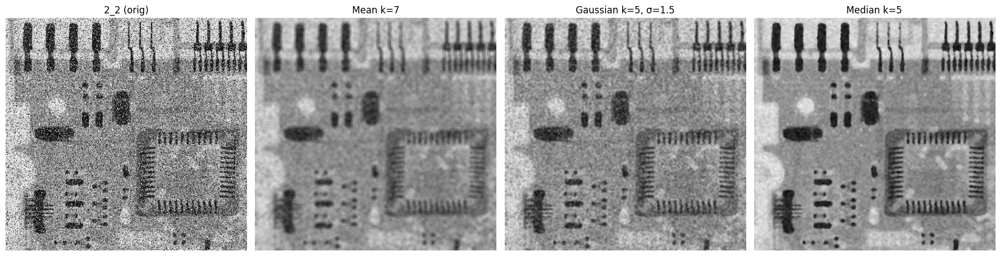

All saved to: ../images/outputs/q2


In [3]:
imgs = ["../images/2_1.png", "../images/2_2.png"]
if len(imgs) == 0:
    print("No images found in ../images, add the noisy USAF images.")
else:
    imgs_to_run = imgs[:2]

    #kernel sizes to test
    mean_ks = [3, 7, 11]
    gauss_ks = [3, 5, 7]
    gauss_sigmas = [0.8, 1.5, 2.5]
    median_ks = [3, 5, 7]

    os.makedirs(OUTPUT_DIR, exist_ok=True)

    for path in imgs_to_run:
        label = os.path.splitext(os.path.basename(path))[0]
        print("Processing:", path)

        g = imread_gray(path)

        #mean filter
        mean_outputs, mean_titles = [], []
        for k in mean_ks:
            mean_out = mean_filter(g, k=k)
            mean_outputs.append(mean_out)
            mean_titles.append(f"Mean k={k}")
        show_imgs_row([g] + mean_outputs, [f"{label} (orig)"] + mean_titles,
                      figsize=(16,4),
                      save_path=os.path.join(OUTPUT_DIR, f"q2_{label}_mean_compare.png"))

        #gaussian filter
        gauss_outputs, gauss_titles = [], []
        for k in gauss_ks:
            for s in gauss_sigmas:
                out = gaussian_filter(g, k=k, sigma=s)
                gauss_outputs.append(out)
                gauss_titles.append(f"G k={k}, σ={s}")
        show_imgs_row([g] + gauss_outputs, [f"{label} (orig)"] + gauss_titles,
                      figsize=(20,9),
                      save_path=os.path.join(OUTPUT_DIR, f"q2_{label}_gaussian_grid.png"))

        #median filter
        med_outputs, med_titles = [], []
        for k in median_ks:
            med_out = median_filter(g, k=k)
            med_outputs.append(med_out)
            med_titles.append(f"Median k={k}")
        show_imgs_row([g] + med_outputs, [f"{label} (orig)"] + med_titles,
                      figsize=(16,4),
                      save_path=os.path.join(OUTPUT_DIR, f"q2_{label}_median_compare.png"))

        #comparision
        rep_mean = mean_outputs[1]  # mean k=7
        rep_gauss = gaussian_filter(g, k=5, sigma=1.5)
        rep_med = med_outputs[1]    # median k=5
        show_imgs_row([g, rep_mean, rep_gauss, rep_med],
                      [f"{label} (orig)", "Mean k=7", "Gaussian k=5, σ=1.5", "Median k=5"],
                      figsize=(18,5),
                      save_path=os.path.join(OUTPUT_DIR, f"q2_{label}_final_compare.png"))

        #saving individual images
        Image.fromarray(np.clip(rep_mean,0,255).astype(np.uint8)).save(os.path.join(OUTPUT_DIR, f"q2_{label}_mean_k7.png"))
        Image.fromarray(np.clip(rep_gauss,0,255).astype(np.uint8)).save(os.path.join(OUTPUT_DIR, f"q2_{label}_gauss_k5_s1p5.png"))
        Image.fromarray(np.clip(rep_med,0,255).astype(np.uint8)).save(os.path.join(OUTPUT_DIR, f"q2_{label}_median_k5.png"))

    print("All saved to:", OUTPUT_DIR)


### Observations

**Mean filter:**
- Smooths noise but blurs details, especially with large kernels which makes it less effective for salt-and-pepper noise.

**Gaussian filter:**
- Better trade-off. Small σ keeps details, but large σ oversmooths. This filter is best for gaussian like noise but not ideal for impulse noise

**Median filter:**
- Best for salt-and-pepper noise. Removes spikes while preserving edges, though very large kernels can flatten textures.


| Kernel Size | Noise Reduction       | Detail Preservation | Blurring Effect              | 
|-------------|-----------------------|---------------------|------------------------------|
| Small       | Moderate to Good      | Good                | Minimal                      | 
| Medium      | Good to Very Good     | Moderate            | Moderate                     | 
| Large       | Excellent             | Poor (detail loss)  | High (very smoothed)         | 


**Explaining choice of Filtering**
- The given noisy image contains a mixture of impulse-like pixels, which indicates that we're dealing with salt-and-pepper noise. In theory, median filtering is the best method for handling this type of noise, which was proven right practically and can be observed in the resulting images shown above too.
- ***Median filter*** works best for this type of noise because:
    - Salt-and-pepper noise basically affects individual pixels by pushing them to extreme values (0 or 255).
    - If we use a mean or Gaussian filter, those individual pixels get averaged with their neighbors, which often just leaves behind dull gray spots instead of removing the noise.
    - The median filter, on the other hand, replaces each pixel with the median value of its neighborhood. This way, the extreme outliers (salt or pepper) are discarded, while the actual edge details are better preserved.
- ***Results:***
    - For both 2_1 and 2_2, median filtering with k=5 or 7 showed the best tradeoff, which was, noise was significantly reduced while edges and line structures were still visible.
    - Larger median kernels (k=7) removed more noise but kind of blurred important chart details.
    - Gaussian filtering improved smoothness but could not fully remove the salt-and-pepper speckles.

**Advanced Alternatives (for salt and pepper noise):**
- ***Adaptive Median Filter***
    - This method extends median filter by adapting the kernel size based on local noise density making it more effective for high density salt-and-pepper noise
- ***Decision-Based/Progessive Switching Median Filter***
    - Detects corrupted pixels (values close to 0 or 255) and replaces only those with median/neighboring values. This preserves clean pixels and avoids unnecessary blurring.
- ***Bilateral or Non-Local Means Filters***
    - Useful for preserving edges while smoothing but they are comparitively more expensive in terms of computation.

**Limitations:**
- Median filtering with large kernels (k=7+) oversmooths the image which leads to wiping out fine USAF chart details.
- Even with adaptive methods, heavy salt-and-pepper noise may not be fully removed without some loss of resolution.
- So there will always be a trade-off between denoising strength and detail preservation.

***In conclusion*** both USAF images contain salt-and-pepper noise, which is best handled by median filtering. 

---

## Q3. Bilateral Filtering for Edge-Preserving Smoothing

### (a) Implementation of Bilateral filter.

In [4]:
def bilateral_filter(img, k=5, sigma_space=8, sigma_range=0.2):
    img = img.astype(np.float64) / 255.0
    half_k = k // 2
    
    x, y = np.meshgrid(np.arange(-half_k, half_k+1), np.arange(-half_k, half_k+1))
    spatial_gaussian = np.exp(-(x**2 + y**2) / (2 * sigma_space**2))
    
    if len(img.shape) == 2:
        img = img[..., np.newaxis]
    
    h, w, c = img.shape
    filtered_img = np.zeros_like(img)
    
    for i in range(h):
        for j in range(w):
            for ch in range(c):
                i_min, i_max = max(i-half_k, 0), min(i+half_k+1, h)
                j_min, j_max = max(j-half_k, 0), min(j+half_k+1, w)
                region = img[i_min:i_max, j_min:j_max, ch]
                
                sp_g = spatial_gaussian[(i_min-i+half_k):(i_max-i+half_k),
                                        (j_min-j+half_k):(j_max-j+half_k)]
                
                center_val = img[i, j, ch]
                range_gaussian = np.exp(-((region - center_val)**2) / (2 * sigma_range**2))
                
                weights = sp_g * range_gaussian
                weights /= np.sum(weights)
                
                filtered_img[i, j, ch] = np.sum(region * weights)
    
    if filtered_img.shape[2] == 1:
        filtered_img = filtered_img[..., 0]
    
    return np.clip(filtered_img * 255, 0, 255).astype(np.uint8)

### (b) Parameter Analysis

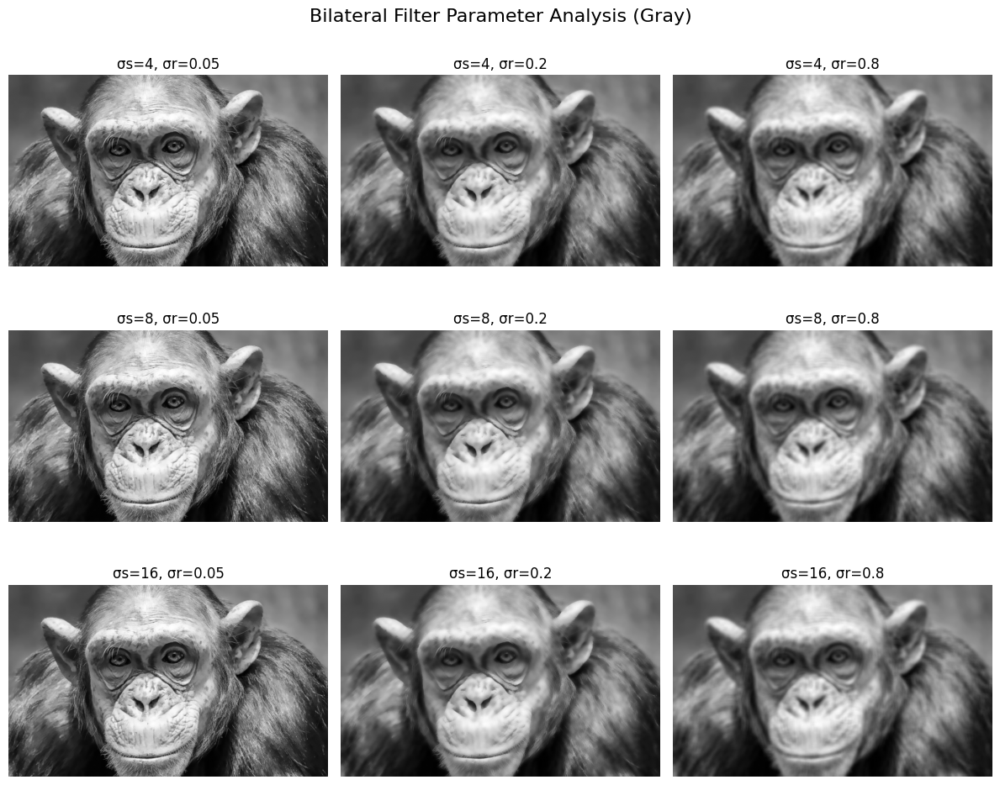

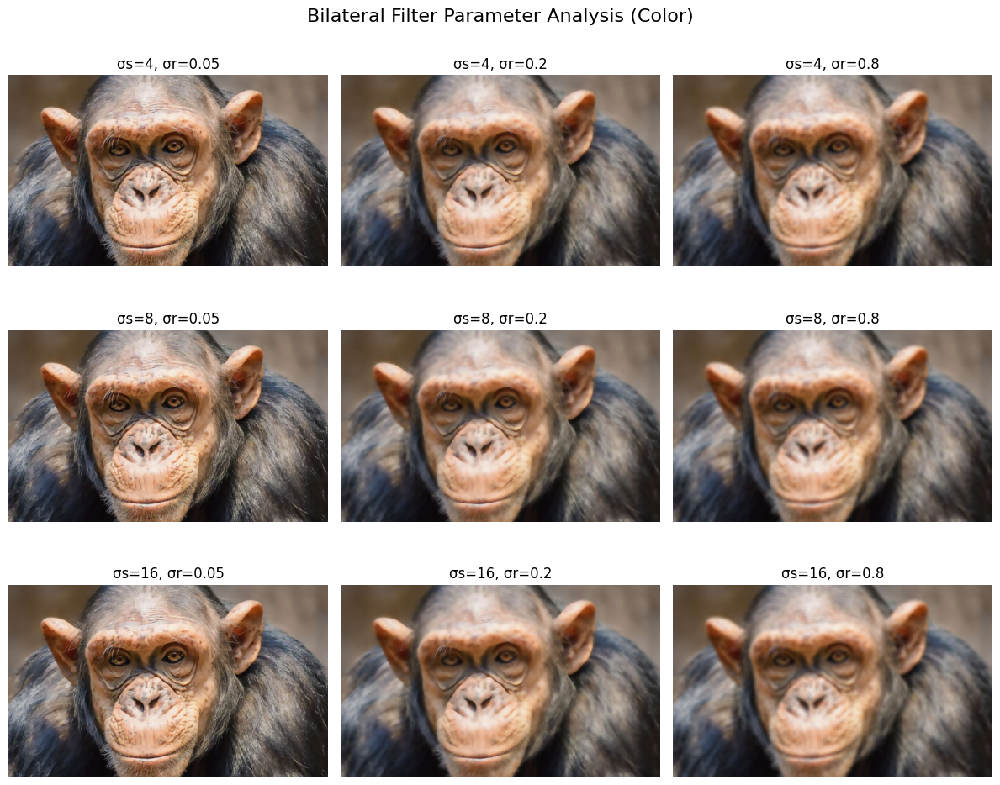

Saved bilateral filter parameter analysis results (grid + individual images) to: ../images/outputs/q3


In [5]:
img_path = "../images/3.jpg"
OUTPUT_DIR = "../images/outputs/q3"
os.makedirs(OUTPUT_DIR, exist_ok=True)

img_c = np.array(Image.open(img_path).convert("RGB"), dtype=np.uint8)
img_g = imread_gray(img_path).astype(np.uint8)

sigma_space_vals = [4, 8, 16]         #controls spatial neighborhood
sigma_range_vals = [0.05, 0.2, 0.8]   #controls intensity similarity

gray_results = []
gray_titles = []

for ss in sigma_space_vals:
    row_results = []
    row_titles = []
    for sr in sigma_range_vals:
        bilat_g = bilateral_filter(img_g, k=11, sigma_space=ss, sigma_range=sr)
        row_results.append(bilat_g)
        row_titles.append(f"σs={ss}, σr={sr}")
        
        save_path = os.path.join(OUTPUT_DIR, f"q3_b_bilateral_gray_ss{ss}_sr{sr}.png")
        Image.fromarray(bilat_g).save(save_path)
    gray_results.append(row_results)
    gray_titles.append(row_titles)

fig, axes = plt.subplots(len(sigma_space_vals), len(sigma_range_vals), figsize=(12, 10))
for i in range(len(sigma_space_vals)):
    for j in range(len(sigma_range_vals)):
        axes[i, j].imshow(gray_results[i][j], cmap="gray")
        axes[i, j].axis("off")
        axes[i, j].set_title(gray_titles[i][j])
plt.suptitle("Bilateral Filter Parameter Analysis (Gray)", fontsize=16)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "q3_b_bilateral_gray_grid.png"))
plt.show()


color_results = []
color_titles = []

for ss in sigma_space_vals:
    row_results = []
    row_titles = []
    for sr in sigma_range_vals:
        bilat_c = bilateral_filter(img_c, k=11, sigma_space=ss, sigma_range=sr)
        row_results.append(bilat_c)
        row_titles.append(f"σs={ss}, σr={sr}")
        
        save_path = os.path.join(OUTPUT_DIR, f"q3_b_bilateral_color_ss{ss}_sr{sr}.png")
        Image.fromarray(bilat_c).save(save_path)
    color_results.append(row_results)
    color_titles.append(row_titles)

fig, axes = plt.subplots(len(sigma_space_vals), len(sigma_range_vals), figsize=(12, 10))
for i in range(len(sigma_space_vals)):
    for j in range(len(sigma_range_vals)):
        axes[i, j].imshow(color_results[i][j])
        axes[i, j].axis("off")
        axes[i, j].set_title(color_titles[i][j])
plt.suptitle("Bilateral Filter Parameter Analysis (Color)", fontsize=16)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "q3_b_bilateral_color_grid.png"))
plt.show()


print("Saved bilateral filter parameter analysis results (grid + individual images) to:", OUTPUT_DIR)


**Role of the Parameters**:

***σ-space***
- Controls ***spatial smoothing***.
- Larger values blur across bigger neighborhoods reducing fine detials in textures.

***σ-range***
- Controls ***intensity smoothing***.
- Larger values blur across larger intensity differences, softening edges and transitions between pixel values.

**Parameter Behaviour**

- ***Small σ-space and σ-range***
    - preserves textures.
    - keeps edges sharp.
- ***Larger σ-space and σ-range***
    - produces strong smoothing.
    - blurs both textures and edges.

**Summary**
- **σ-space** → Determines the **spatial area** used for smoothing.
- **σ-range** → Determines how **pixel value differences** affect smoothing.


### (c) Gaussian vs Bilateral Filtering

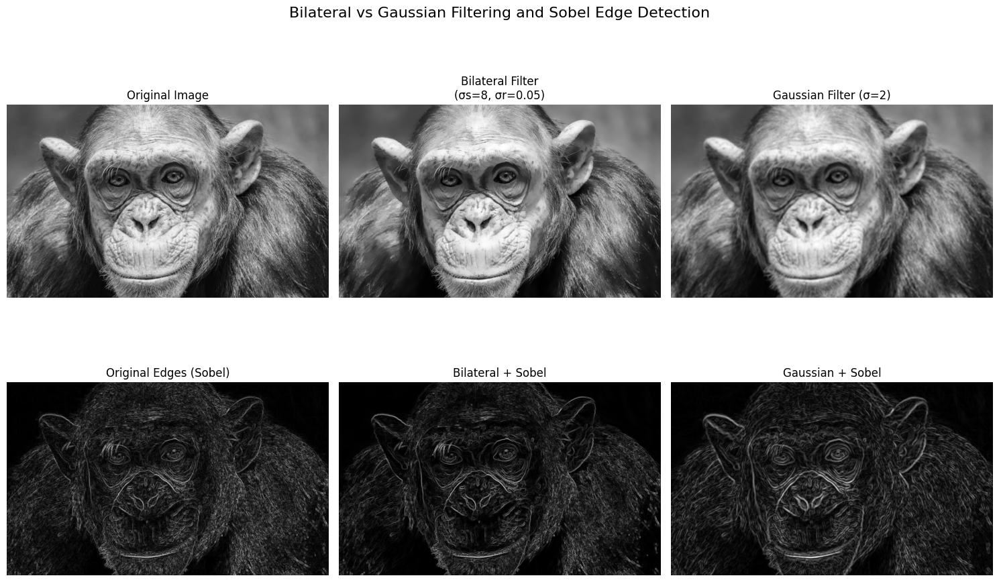

In [6]:
SOBEL_X   = np.array([[-1,0,1],[-2,0,2],[-1,0,1]], dtype=np.float32)
SOBEL_Y   = np.array([[1,2,1],[0,0,0],[-1,-2,-1]], dtype=np.float32)
def sobel_edges(g):
    #sobel edge detection (gradient magnitude)
    gx, gy = conv2d_gray(g, SOBEL_X), conv2d_gray(g, SOBEL_Y)
    mag = np.hypot(gx, gy); mag = (mag / (mag.max()+1e-6)) * 255
    return mag

optimal_sigma_space = 8
optimal_sigma_range = 0.05

bilateral_g = bilateral_filter(img_g, k=15, sigma_space=optimal_sigma_space, sigma_range=optimal_sigma_range)
gaussian_g = gaussian_filter(img_g, sigma=2.0)

#apply Sobel edge detector
original_edges = sobel_edges(img_g)
bilateral_edges = sobel_edges(bilateral_g)
gaussian_edges = sobel_edges(gaussian_g)

Image.fromarray((bilateral_g * 255).astype(np.uint8)).save(os.path.join(OUTPUT_DIR, f"q3_c_bilateral_gray_ss{optimal_sigma_space}_sr{optimal_sigma_range}.png"))
Image.fromarray((gaussian_g * 255).astype(np.uint8)).save(os.path.join(OUTPUT_DIR, "q3_c_gaussian_gray_sigma2.png"))
Image.fromarray((original_edges * 255).astype(np.uint8)).save(os.path.join(OUTPUT_DIR, "q3_c_edges_original.png"))
Image.fromarray((bilateral_edges * 255).astype(np.uint8)).save(os.path.join(OUTPUT_DIR, "q3_c_edges_bilateral.png"))
Image.fromarray((gaussian_edges * 255).astype(np.uint8)).save(os.path.join(OUTPUT_DIR, "q3_c_edges_gaussian.png"))

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

#filtered images
axes[0, 0].imshow(img_g, cmap="gray")
axes[0, 0].set_title("Original Image")
axes[0, 0].axis("off")

axes[0, 1].imshow(bilateral_g, cmap="gray")
axes[0, 1].set_title(f"Bilateral Filter\n(σs={optimal_sigma_space}, σr={optimal_sigma_range})")
axes[0, 1].axis("off")

axes[0, 2].imshow(gaussian_g, cmap="gray")
axes[0, 2].set_title("Gaussian Filter (σ=2)")
axes[0, 2].axis("off")

#sobel edges
axes[1, 0].imshow(original_edges, cmap="gray")
axes[1, 0].set_title("Original Edges (Sobel)")
axes[1, 0].axis("off")

axes[1, 1].imshow(bilateral_edges, cmap="gray")
axes[1, 1].set_title("Bilateral + Sobel")
axes[1, 1].axis("off")

axes[1, 2].imshow(gaussian_edges, cmap="gray")
axes[1, 2].set_title("Gaussian + Sobel")
axes[1, 2].axis("off")

plt.suptitle("Bilateral vs Gaussian Filtering and Sobel Edge Detection", fontsize=16)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "q3_c_filter_edge_comparison.png"))
plt.show()

**Filtered Image Comparision**
- Our ***Original*** image has high details and texture.
- The ***Bilateral Filter*** smooths out flat areas while still preserving edges.
- And ***Gaussian Filter*** smooths the whole image some-what uniformly, blurring textures and edges alike.

**Edge Detection using Sobel Operator**
- ***Original + Sobel***: Detects fine edges but including noise though.
- ***Bilateral + Sobel***: Preserves strong edges and suppresses noise without over smoothing.
- ***Gaussian + Sobel***: Loses sharpness and edges are blurred.

**Bilateral Filter vs Gaussian Filter**
- Bilateral filter smoothens the image while maintaining sharp edges while the gaussian filter smooths out both textures and edges.
- Therefore bilateral filter produces more accurate edge maps.
- And since gaussian filter causes edge blurring, it leads to less accurate edge detection.
- This is because Bilateral filter considers both spatial distance and intensity while the gaussian depends only on spatial distance. 
- In bilateral filter pixels with similar intensities are favoured leading to preserving edges while smoothing.
- and in gaussian filter we average the pixel intensities regardless of their values, so edges get blurred

***In conclusion*** the **Bilteral Filter** is ideal for preprocessing before edge detection as it reduces noise without sacrificing important edge information.

## Q4. DFT and FFT

In [7]:
OUTPUT_DIR = "../images/outputs/q4"
os.makedirs(OUTPUT_DIR, exist_ok=True)

### (a) DFT of a 1D array

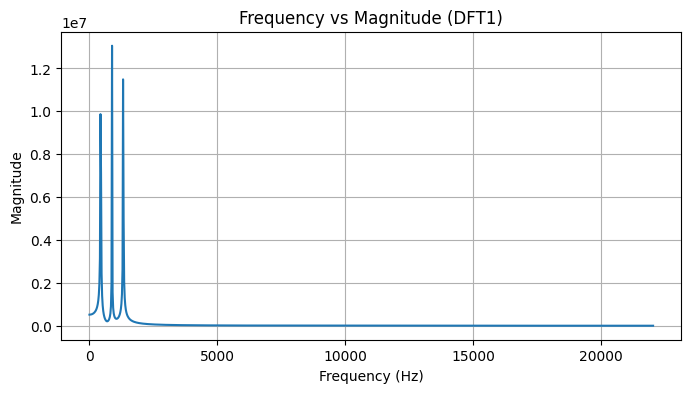

In [8]:
#a
#computing 1d DFT of a 1d array
def dft1(x):
    x = np.asarray(x, dtype=complex)
    N = len(x)
    n = np.arange(N)
    k = n.reshape((N, 1))
    W = np.exp(-2j * np.pi * k * n / N)
    return np.dot(W, x)

rate, data = wavfile.read("../audio_files/1.wav") 
if data.ndim > 1:  #stereo to mono
    data = data[:, 0]

X = dft1(data[:2048])   #taking first 2048 samples
freqs = np.fft.fftfreq(len(X), 1/rate)

plt.figure(figsize=(8,4))
plt.plot(freqs[:len(X)//2], np.abs(X)[:len(X)//2])
plt.title("Frequency vs Magnitude (DFT1)")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude")
plt.grid(True)
plt.savefig(os.path.join(OUTPUT_DIR, "freq_vs_mag.png"))
plt.show()

### (b) DFT of a 2D array

In [9]:
#b
#computing 2d DFT
def dft2(img):
    M, N = img.shape
    dft_rows = np.array([dft1(row) for row in img])
    dft_full = np.array([dft1(col) for col in dft_rows.T]).T
    return dft_full

### (c) DFT of a 1D array using the FFT Algorithm

In [10]:
#c
#1d FFT recursively(cooley-turkey)
def fft1(x):
    x = np.asarray(x, dtype=complex)
    N = x.shape[0]

    if N <= 1:
        return x

    if N % 2 != 0:
        next_pow2 = 1 << (N - 1).bit_length()
        x = np.pad(x, (0, next_pow2 - N), mode='constant')
        N = next_pow2

    even = fft1(x[::2])
    odd = fft1(x[1::2])
    factor = np.exp(-2j * np.pi * np.arange(N) / N)

    result = np.zeros(N, dtype=complex)
    half = N // 2
    result[:half] = even + factor[:half] * odd
    result[half:] = even - factor[:half] * odd
    return result

### (d) 2D DFT of a 2D array using the FFT Algorithm

In [11]:
#d
#2d fft of 2D array
def fft2(img):
    fft_rows = np.array([fft1(row) for row in img])
    fft_full = np.array([fft1(col) for col in fft_rows.T]).T
    return fft_full

### (e) Time Taken vs Array Length

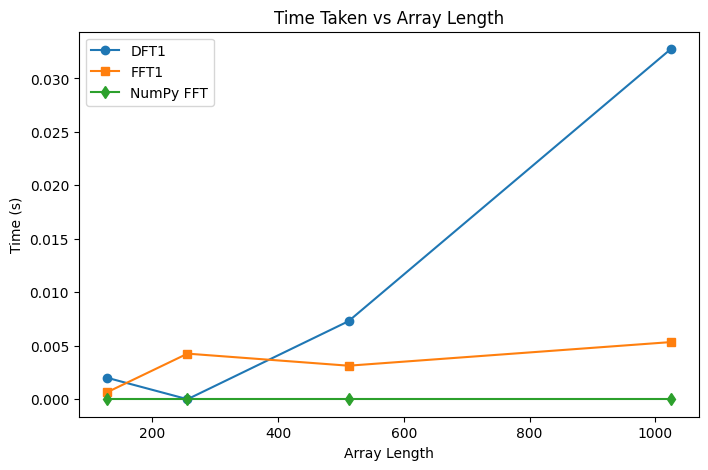

In [12]:
#e
#timing analysis
lengths = [128, 256, 512, 1024]
dft_times, fft_times, npfft_times = [], [], []

for L in lengths:
    x = np.random.rand(L)

    start = time.time()
    dft1(x)
    dft_times.append(time.time() - start)

    start = time.time()
    fft1(x)
    fft_times.append(time.time() - start)

    start = time.time()
    np.fft.fft(x)
    npfft_times.append(time.time() - start)

plt.figure(figsize=(8,5))
plt.plot(lengths, dft_times, 'o-', label="DFT1")
plt.plot(lengths, fft_times, 's-', label="FFT1")
plt.plot(lengths, npfft_times, 'd-', label="NumPy FFT")
plt.xlabel("Array Length")
plt.ylabel("Time (s)")
plt.title("Time Taken vs Array Length")
plt.legend()
plt.savefig(os.path.join(OUTPUT_DIR, "time_vs_length.png"))
plt.show()

**Observed Differences in DFT, FFT, and NumPy FFT Computation Time**
- ***DFT shows quadratic growth***
    - the time taken by DFT1 increases rapidly with array length
    - matches the expected **O(N²)** complexity
    - for 1000 elements, the time is already above 0.03s, very much larger than FFT
- ***FFT grows much slower***
    - FFT1 computation time increases gradually with array size, confirming the expected **O(N logN)** behaviour.
    - At 1000 elements, the FFT takes only approximately 0.006s compared to DFT's 0.03s
- ***NumPy FFT is the most efficient***
    - NumPy’s FFT implementation shows no increase in time with array length.
    - It remains close to 0 s even at 1000 elements, indicating heavy optimization at the library level.

- ***In conclusion***
    - The plot validates the theoretical complexities:
        - **DFT (O(N²))** grows steeply with input size.
        - **FFT (O(N log N))** grows much more slowly.
        - NumPy FFT outperforms both due to optimized low-level implementations.
    - Confirms that FFT (and especially NumPy FFT) is ideal for large datasets.

### (f) 2D DFT and 2D FFT of the given image signals

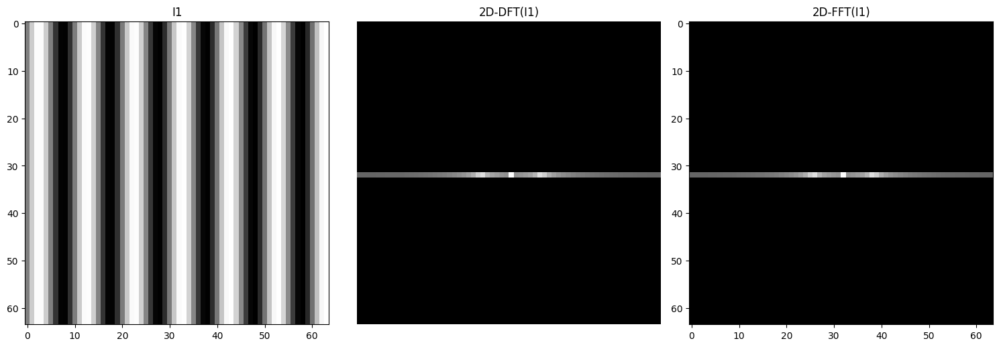

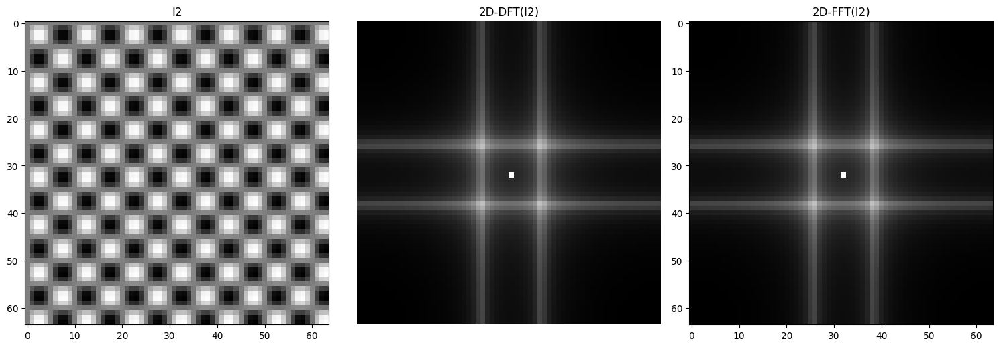

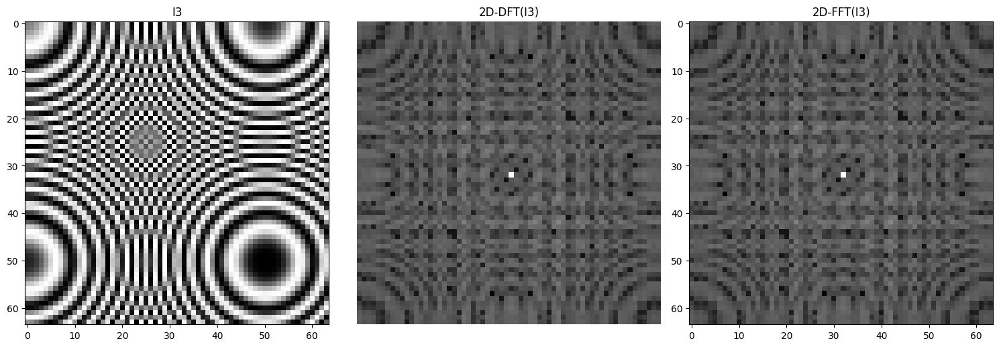

results saved in: ../images/outputs/q4


In [13]:
#f - 2D DFT/FFT on I1, I2, I3
L=64
x = np.linspace(0,2*np.pi,L)
y = np.linspace(0,2*np.pi,L)
X, Y = np.meshgrid(x, y)

I1 = 0.5 * (1 + np.sin(2 * np.pi * X))
I2 = 0.5 * (1 + np.sin(2 * np.pi * X ) * np.sin(2 * np.pi * Y ))
I3 = 0.5 * (1 + np.sin(2 * np.pi * (X**2 + Y**2)))

for i, I in enumerate([I1, I2, I3], start=1):
    D = dft2(I)
    F = fft2(I)

    #combined subplot view
    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(I, cmap="gray")
    plt.title(f"I{i}")

    plt.subplot(1,3,2)
    plt.imshow(np.log(1+np.abs(np.fft.fftshift(D))), cmap="gray")
    plt.title(f"2D-DFT(I{i})")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(np.log(1+np.abs(np.fft.fftshift(F))), cmap="gray")
    plt.title(f"2D-FFT(I{i})")

    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, f"I{i}_dft_fft.png"))
    plt.show()

    plt.imsave(os.path.join(OUTPUT_DIR, f"I{i}.png"), I, cmap="gray")
    plt.imsave(os.path.join(OUTPUT_DIR, f"I{i}_dft.png"), np.log(1+np.abs(D)), cmap="gray")
    plt.imsave(os.path.join(OUTPUT_DIR, f"I{i}_fft.png"), np.log(1+np.abs(F)), cmap="gray")

print("results saved in:", OUTPUT_DIR)
